## Task 1

In [1]:
import array
import numpy as np
import matplotlib.pyplot as plt


binfpath="/fs/lustre/cita/hqchen/data/z-ifrit-a=0.1401.bin"
with open(binfpath,'rb') as f:
    binarydata=f.read()
lllen=8; flen=4; ilen=4 

N=1024

firstfield=lllen*2+3*ilen

nextfield=firstfield

xHI=array.array('f',binarydata[nextfield+lllen:nextfield+lllen+N**3*flen])
xHI=np.reshape(xHI,(N,N,N),order='F')

nextfield+=lllen+N**3*flen
delta=array.array('f',binarydata[nextfield+lllen:nextfield+lllen+N**3*flen])
delta=np.reshape(delta,(N,N,N),order='F')

nextfield+=lllen+N**3*flen
T=array.array('f',binarydata[nextfield+lllen:nextfield+lllen+N**3*flen])
T=np.reshape(T,(N,N,N),order='F')





/tmp/ipykernel_833385/591149048.py:8: RuntimeWarning: divide by zero encountered in log10
  im2  = ax2.imshow(np.log10(delta[0]))
/tmp/ipykernel_833385/591149048.py:14: RuntimeWarning: divide by zero encountered in log10
  im3 = ax3.imshow(np.log10(T[0]))


Text(0.5, 0.98, 'A plot of a slice of $\\log(T)$')

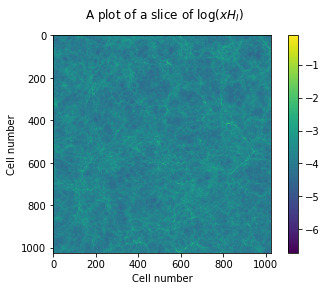

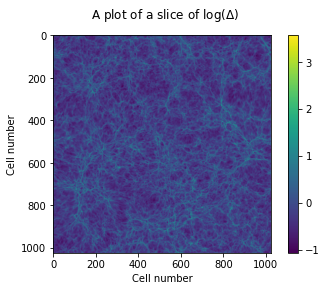

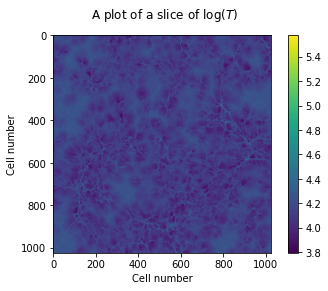

In [2]:
fig1, ax1 = plt.subplots()
im1 = ax1.imshow(np.log10(xHI[0]))
ax1.set(xlabel = "Cell number", ylabel = "Cell number")
fig1.colorbar(im1)
fig1.suptitle("A plot of a slice of $\log(xH_I)$")

fig2, ax2 = plt.subplots()
im2  = ax2.imshow(np.log10(delta[0]))
fig2.colorbar(im2)
ax2.set(xlabel = "Cell number", ylabel = "Cell number")
fig2.suptitle("A plot of a slice of $\log(\Delta)$")

fig3, ax3 = plt.subplots()
im3 = ax3.imshow(np.log10(T[0]))
fig3.colorbar(im3)
ax3.set(xlabel = "Cell number", ylabel = "Cell number")
fig3.suptitle("A plot of a slice of $\log(T)$")

## Task 2

In [3]:
import astropy

In [4]:
from astropy.cosmology import WMAP9 as cosmo
from astropy import units as u
crt_dns = cosmo.critical_density(6)
mean_gas_density = crt_dns*cosmo.Ob(6)
print(mean_gas_density)

1.432778841086186e-28 g / cm3


## Task 3

In [5]:
from astropy.constants import m_p
p = m_p.to(u.g)


In [6]:
print(delta.max())
index = np.where(delta == delta.max())
print(index[0])

39938.367
[203]


In [7]:
print(index[2])
print(delta[index][0])

[460]
39938.367


In [8]:
sigma  = 4.48e-18*u.cm**2
nH =  (0.76*mean_gas_density/p)
nHI = xHI*nH
nHI = nHI.astype('float128')
cml = (40/0.68)/1024*u.Mpc 
ds = cml*(1/(1+6))
ds = ds.to(u.cm)
dT = sigma * nHI * ds

In [9]:
print(dT[index][0])

2.2700645736128338


In [10]:
print(nHI.max())

5.547614273382351e-05 1 / cm3


## Task 4

In [11]:
from numpy import float128
print(nHI)

[[[6.74571377e-09 6.38827302e-09 5.75865577e-09 ... 1.07600648e-08
   8.21360135e-09 7.04414260e-09]
  [7.67662289e-09 6.92509960e-09 6.13529849e-09 ... 1.13985843e-08
   9.96054794e-09 8.55018278e-09]
  [9.01550923e-09 7.51253726e-09 6.50632348e-09 ... 1.14072840e-08
   1.12177583e-08 1.05493712e-08]
  ...
  [5.40711653e-09 5.72221870e-09 6.19928953e-09 ... 6.03759931e-09
   5.55259971e-09 5.45984546e-09]
  [5.71314507e-09 5.72291681e-09 5.85148463e-09 ... 7.31123873e-09
   6.16871665e-09 5.86614579e-09]
  [6.06233908e-09 5.96980865e-09 5.72571146e-09 ... 9.11899800e-09
   6.97984026e-09 6.31654506e-09]]

 [[5.48221868e-09 5.28250510e-09 5.17780352e-09 ... 8.64833005e-09
   7.15157933e-09 6.03492856e-09]
  [6.61523991e-09 5.69851810e-09 5.04244824e-09 ... 9.86796511e-09
   9.04403130e-09 7.89581023e-09]
  [8.48688053e-09 6.67445255e-09 5.43424594e-09 ... 9.99739669e-09
   1.04928599e-08 1.01232711e-08]
  ...
  [5.35914690e-09 5.90746518e-09 6.73172940e-09 ... 5.94980287e-09
   5.42529

In [12]:
from numpy import float128

new_tau = dT[index][0]
print(new_tau)
percent = float128(10)
percent = float128(np.exp(-new_tau)*100)
print(percent)

2.2700645736128338
10.3305509057770924745


## Task 5

In [13]:
halofpath="/fs/lustre/cita/hqchen/data/hlist_0.14005.list"
halodata = np.loadtxt(halofpath, skiprows = 63) 

halomass = halodata[:, 10]




#mass = []
#for i in range(len(halodata)):
#    mass = np.append(mass, float128(halodata[i][83:94]))

[]

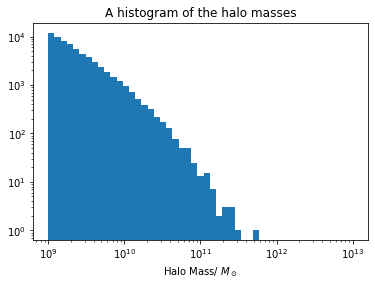

In [14]:
plt.hist(halomass, bins = np.logspace(start =np.log10(10**9), stop = np.log10(10**13)))
plt.gca().set_xscale("log")
plt.title("A histogram of the halo masses")
plt.xlabel("Halo Mass/ $M_\odot$")
plt.loglog()




## Task 6

/tmp/ipykernel_833385/4078942385.py:25: RuntimeWarning: divide by zero encountered in log10
  im2  = ax2.imshow(np.log10(delta[0]))
/tmp/ipykernel_833385/4078942385.py:33: RuntimeWarning: divide by zero encountered in log10
  im3 = ax3.imshow(np.log10(T[0]))


Text(0.5, 0.98, 'A plot of a slice of $\\log(T)$')

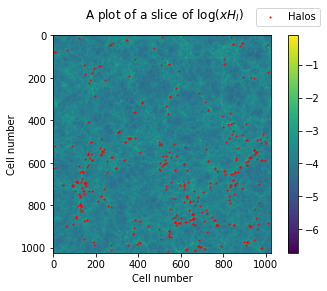

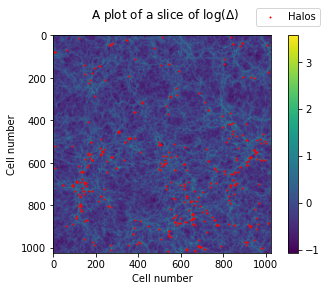

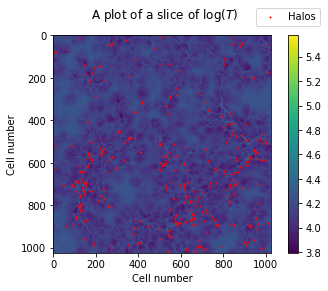

In [15]:
x, y, z = halodata[:, 17], halodata[:, 18], halodata[:, 19]

m = 1024*0.989391/(40)
x, y, z = m*x, m*y, m*z




x_int = x.astype(int)
indices = np.where(x_int ==0)
y_int = y[indices]
z_int = z[indices]


fig1, ax1 = plt.subplots()
im1 = ax1.imshow(np.log10(xHI[0]))
ax1.set(xlabel = "Cell number", ylabel = "Cell number")
ax1.scatter(z_int, y_int, color='red', s=1, label= 'Halos')
ax1.legend(loc = 'upper right', bbox_to_anchor = (1.25, 1.15))

fig1.colorbar(im1)
fig1.suptitle("A plot of a slice of $\log(xH_I)$")

fig2, ax2 = plt.subplots()
im2  = ax2.imshow(np.log10(delta[0]))
ax2.scatter(z_int, y_int, color='red', s=1, label= 'Halos')
ax2.legend(loc = 'upper right', bbox_to_anchor = (1.25, 1.15))
fig2.colorbar(im2)
ax2.set(xlabel = "Cell number", ylabel = "Cell number")
fig2.suptitle("A plot of a slice of $\log(\Delta)$")

fig3, ax3 = plt.subplots()
im3 = ax3.imshow(np.log10(T[0]))
ax3.scatter(z_int, y_int, color='red', s=1, label= 'Halos')
ax3.legend(loc = 'upper right', bbox_to_anchor = (1.25, 1.15))
fig3.colorbar(im3)
ax3.set(xlabel = "Cell number", ylabel = "Cell number")
fig3.suptitle("A plot of a slice of $\log(T)$")



/tmp/ipykernel_833385/2493785927.py:11: MatplotlibDeprecationWarning: Starting from Matplotlib 3.6, colorbar() will steal space from the mappable's axes, rather than from the current axes, to place the colorbar.  To silence this warning, explicitly pass the 'ax' argument to colorbar().
  fig4.colorbar(im1)


Text(0.5, 0.98, 'A plot of a slice of $\\log(xH_I)$')

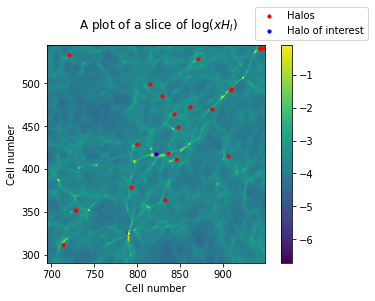

In [16]:

pointz, pointy = z[indices[0][0]], y[indices[0][0]]

fig4, ax4 = plt.subplots()
im4 = ax4.imshow(np.log10(xHI[0]))
ax4.set(xlabel = "Cell number", ylabel = "Cell number")
ax4.set_xlim([pointz-5*m, pointz + 5*m])
ax4.set_ylim([pointy - 5*m, pointy+5*m])
ax4.scatter(z_int, y_int, color='red', s=10, label= 'Halos')
ax4.scatter(pointz, pointy, color = 'blue', s=10, label = 'Halo of interest')
ax4.legend(loc = 'upper right', bbox_to_anchor = (1.5, 1.20))
fig4.colorbar(im1)
fig4.suptitle("A plot of a slice of $\log(xH_I)$")


## Task 7

/tmp/ipykernel_833385/2979926674.py:19: MatplotlibDeprecationWarning: Starting from Matplotlib 3.6, colorbar() will steal space from the mappable's axes, rather than from the current axes, to place the colorbar.  To silence this warning, explicitly pass the 'ax' argument to colorbar().
  fig4.colorbar(im1)


Text(0.5, 0.98, 'A plot of a slice of $\\log(xH_I)$')

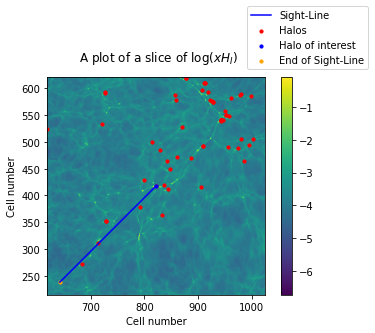

In [17]:
from sympy.solvers import solve
from sympy import Symbol

length = 10*m

pointsz = [pointz, pointz - length/np.sqrt(2)]
pointsy = [pointy, pointy - length/np.sqrt(2) ]

fig4, ax4 = plt.subplots()
im4 = ax4.imshow(np.log10(xHI[0]))
ax4.set(xlabel = "Cell number", ylabel = "Cell number")
ax4.set_xlim([pointz-8*m, pointz + 8*m])
ax4.set_ylim([pointy - 8*m, pointy+8*m])
ax4.plot(pointsz, pointsy, color = 'blue', label = 'Sight-Line')
ax4.scatter(z_int, y_int, color='red', s=10, label= 'Halos')
ax4.scatter(pointz, pointy, color = 'blue', s=10, label = 'Halo of interest')
ax4.scatter(pointz - length/np.sqrt(2), pointy - length/np.sqrt(2), color = 'orange', s=10, label = 'End of Sight-Line')
ax4.legend(loc = 'upper right', bbox_to_anchor = ( 1.5, 1.35))
fig4.colorbar(im1)
fig4.suptitle("A plot of a slice of $\log(xH_I)$")


[642 238]
0.39824623
3.7031121


Text(0, 0.5, 'Density contrast')

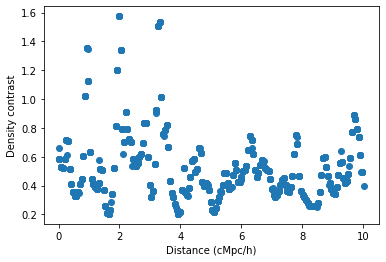

In [18]:
t = np.linspace(0, 1, 1000)
sight = np.zeros((len(t), 2))
for i in range(len(t)):
    sight[i] = t[i]*(np.array((-length/np.sqrt(2), -length/np.sqrt(2)))) + np.array((pointz, pointy))


sight = np.around(sight)
sight = sight.astype(int)
print(sight[999])
print(delta[0][sight[999][0]][sight[999][1]])
print(delta[0][1001][597])
density = np.zeros(len(t))

for i in range(len(t)):
    density[i] = delta[0][sight[i][0]][sight[i][1]]

distance = np.zeros(len(t))
for i in range(len(t)):
    distance[i] = np.linalg.norm(sight[i]- np.array((pointz, pointy)))
distance = distance/m
plt.scatter(distance, density)
plt.xlabel('Distance (cMpc/h)' )
plt.ylabel('Density contrast')

## Analyzing Lyman Limit Systems

In [101]:
#Function to choose a Lymann Limit system given a LOS 
legnth = 10*m

def lyman(start, direction):
    ''' A function to select a Lyman Limit System given a start point and an end point
    Parameters
    __________
    start : contains the positional cooridinates of the start point
           numpy array
    end : contains the positional coordinates of the end point
           numpy array
    '''
    t = np.linspace(0, 1, 1000)
    sight = np.zeros((len(t), 3))
    new_sight = np.zeros((len(t), 3))
    for i in range(len(t)):
        sight[i] = start + t[i]*(length*direction)
        new_sight[i] = start + t[i]*(length*direction)
        if new_sight[i][0]<0: 
            new_sight[i][0] = 1023 + new_sight[i][0]
        if new_sight[i][1]<0: 
            new_sight[i][1] = 1023 + new_sight[i][1]
        if new_sight[i][2]<0: 
            new_sight[i][2] = 1023 + new_sight[i][2]
        if new_sight[i][0]> 1023:
            new_sight[i][0] = new_sight[i][0] -1023
        if new_sight[i][1]> 1023:
            new_sight[i][1] = new_sight[i][1] -1023
        if new_sight[i][2]> 1023:
            new_sight[i][2] =  new_sight[i][2] -1023
    sight = np.around(sight)
    sight = sight.astype(int)
    new_sight = np.around(new_sight)
    new_sight = new_sight.astype(int)
    density = np.zeros(len(t))
    LLS = np.array([])
    for i in range(len(t)):
        density[i] = delta[new_sight[i][0]][new_sight[i][1]][new_sight[i][2]]
        if density[i]>10**2 and sight[i].any()!= LLS.any():
            LLS = np.append(LLS, np.ndarray.tolist(sight[i]))
    return LLS, sight, new_sight
    

In [49]:
from scipy.signal import argrelextrema

In [54]:
#Test

index = [0, 3]
val = [1, 2, 4, 5, 6, 7]
print([val[i] for i in index])

[1, 5]


In [102]:
output = []
dns_max = []
dist_max = []
start = np.array((0, pointy, pointz))
for i in range(10000):
    direction = np.array((np.random.randint(0, 1023), np.random.randint(0, 1023), np.random.randint(0, 1023)))
    direction = direction/(np.linalg.norm(direction))
    lls, sight, new_sight = lyman(start, direction)
    if lls.size > 0:
        output.append(np.ndarray.tolist(lls))
        #Code for finding the local density maxima on a sightline
        d, dns_sight = np.zeros(len(sight)), np.zeros(len(sight)) 
        for j in range(len(sight)):
            d[j]= np.linalg.norm(sight[j] - start)
            dns_sight[j] = delta[new_sight[j][0]][new_sight[j][1]][new_sight[j][2]]
        sight_max = argrelextrema(dns_sight, np.greater)
        max_val, d_max = [dns_sight[k] for k in sight_max], [d[k] for k in sight_max]
        dns_max = np.append(dns_max, np.array(max_val))
        dist_max = np.append(dist_max, np.array(d_max))
        if d.max()>256:
            plt.plot(d, dns_sight)
        

In [21]:
output.sort()
newout = np.unique(output, axis = 0)
print(newout) 

[[  0. 424. 861.]
 [  0. 453. 832.]
 [  0. 491. 990.]
 ...
 [205. 526. 854.]
 [213. 525. 858.]
 [219. 449. 930.]]


/tmp/ipykernel_833385/2707509632.py:18: RuntimeWarning: divide by zero encountered in log10
  plt.imshow(np.log10(delta[newout[i][0]]))


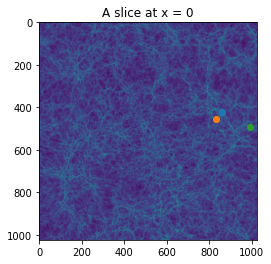

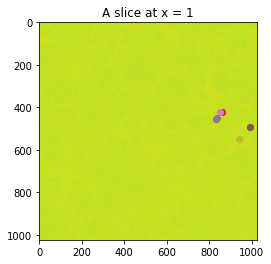

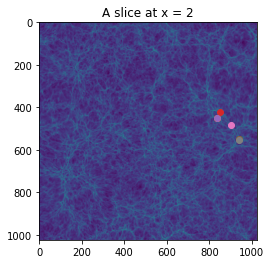

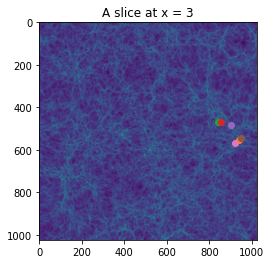

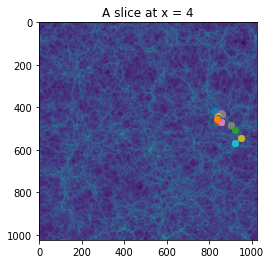

...

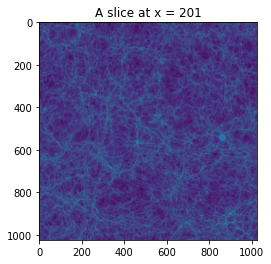

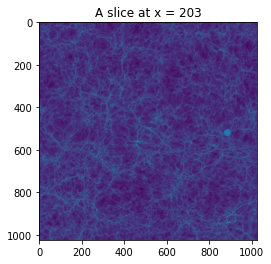

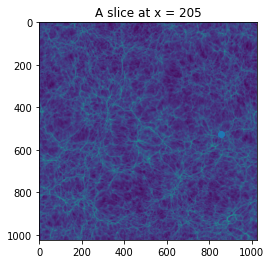

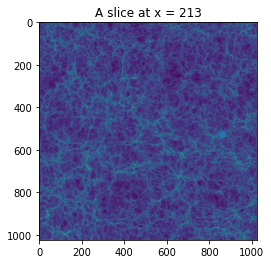

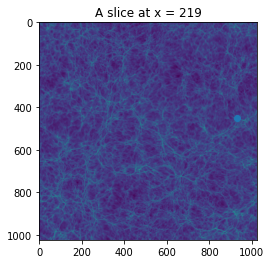

[  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  68  69  70  71  72
  73  74  75  76  77  78  79  81  82  83  84  85  88  89  92  93  96  99
 100 101 102 104 105 106 133 141 143 144 148 150 152 154 155 161 174 177
 181 182 185 194 195 199 201 203 205 213 219]


In [23]:
from matplotlib.pyplot import cm


newout = np.asarray(newout, dtype = 'int')

x = np.unique(newout[:,0], axis= 0)

color = iter(cm.viridis(np.linspace(0, 1, len(newout))))
for i in range(len(newout)):
    count = 1
    if i>0 and newout[i][0] == newout[i-1][0]:
        count = count + 1 
    c = next(color)
    y = list(filter(lambda x: x[0] == newout[i][0], newout))
    for point in y:
        plt.scatter(point[2], point[1])
    if count == 1:
        plt.imshow(np.log10(delta[newout[i][0]]))
        plt.title('A slice at x = ' + str(newout[i][0]))
        plt.show()
print(x)


In [28]:
#Now, we will plot the number of LLS a particular distance from the quasar
distance = np.zeros((len(newout)))
for i in range(len(newout)):
    distance[i] = np.linalg.norm((newout[i]-start))
distance = distance/m
print(distance)

[1.58013543 1.46032927 7.25731921 1.13949895 1.43836348 6.95859174
 4.08732255 7.08035867 2.11735996 2.50381603 4.08827586 7.14690544
 7.13411465 0.34042886 1.32587527 1.42112378 1.31987217 1.46961534
 1.51861148 1.53084597 1.54399336 1.2097897  1.57834059 1.61153771
 1.55240312 5.31811985 0.36885472 0.26544466 0.27123237 1.41170138
 1.5990079  1.19331427 1.23814371 1.24567    4.16489802 0.33529526
 0.34894721 0.34884998 0.37465634 0.39092989 0.41036878 0.43254646
 0.40260173 0.43603132 0.45696523 0.46355406 1.65501955 1.70600168
 1.55669468 5.35084605 7.25724495 0.36426229 0.52518741 0.55124259
 0.57332951 1.56943246 1.76303515 1.81441869 1.04465525 1.86605801
 1.09842642 1.8637635  4.37801765 4.25228208 0.50254719 0.52371219
 1.45559773 1.43833    1.47259754 1.92401835 2.91122458 3.32830002
 3.35301496 5.38945893 5.4105135  0.66635833 0.71371462 1.34712534
 2.11773463 2.14914946 2.40889297 2.62909888 2.83668475 2.73939215
 2.76938411 2.83006696 3.13068738 4.42852441 0.577423   0.7612

Text(0.5, 1.0, 'Histogram of distances to LLS')

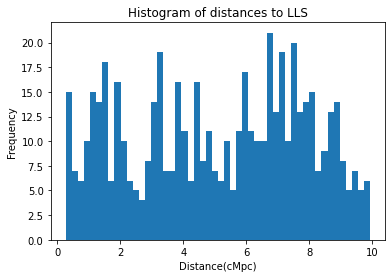

In [120]:
plt.hist(distance, bins=50)
plt.xlabel('Distance(cMpc)')
plt.ylabel('Frequency')
plt.title('Histogram of distances to LLS')

10.005646128173817


Text(0.5, 1.0, 'Maximum density contrast vs. distance of LLS')

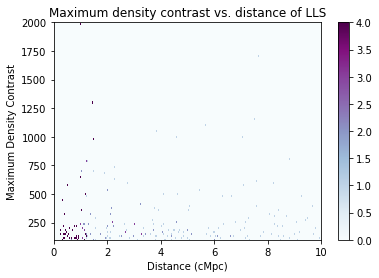

In [118]:
#Now we will plot a histogram of the local maxima of the density contrast, along with the distance at which they occur
lls_delta = np.zeros((len(newout)))
for i in range(len(newout)):
    lls_delta[i] = delta[newout[i][0]][newout[i][1]][newout[i][2]]
comoving_dist = dist_max/m  
plt.hist2d(comoving_dist, dns_max, bins = (400, 400), cmap=plt.cm.BuPu, vmin =0, vmax = 4)
plt.colorbar()
print(comoving_dist.max())

plt.xlim([0, 10])
plt.ylim([100, 2000])
plt.xlabel('Distance (cMpc)')
plt.ylabel('Maximum Density Contrast')
plt.title('Maximum density contrast vs. distance of LLS')